In [455]:
import networkx as nx
import math
import matplotlib.pyplot as plt

%matplotlib inline

N = 375  # Central Nodes from each cluster  250; 250
bags=7 #Number of bags
# k = 250 # Number of samples in each bag
k = math.ceil((N*2/bags)*1.5) 
n_splits = 5 # Number of splits in K_fold

In [456]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectPercentile

# load the dataset
df = pd.read_csv('pd_speech_features.csv')

# combine all entries with the same id into one entry
df = df.groupby('id').mean()

X: pd.DataFrame = df.drop('class', axis=1)
Y = df['class']

print(X.shape)

selector = SelectPercentile(percentile=100)
X_new = selector.fit_transform(X, Y)

# Get the support mask
mask = selector.get_support()

# Get the column names
selected_features = X.columns[mask]

X = X[selected_features]
print(X.shape)
print(X)

(252, 753)
(252, 753)
     gender       PPE       DFA      RPDE   numPulses  numPeriodsPulses  \
id                                                                        
0       1.0  0.823387  0.696370  0.567250  235.333333        234.333333   
1       0.0  0.415637  0.793993  0.592453  213.333333        211.000000   
2       1.0  0.801973  0.619967  0.520563  319.333333        318.333333   
3       0.0  0.828707  0.626097  0.537183  493.000000        492.000000   
4       0.0  0.831287  0.779397  0.726717  362.666667        361.666667   
..      ...       ...       ...       ...         ...               ...   
247     0.0  0.751703  0.651830  0.586847  326.000000        324.666667   
248     1.0  0.611750  0.688327  0.452343  356.666667        355.333333   
249     1.0  0.819857  0.788800  0.373520  339.666667        338.666667   
250     0.0  0.600530  0.569010  0.411987  402.333333        401.000000   
251     0.0  0.844917  0.745653  0.476707  353.666667        352.666667   

  

In [457]:
from imblearn.over_sampling import SVMSMOTE

svmsmote = SVMSMOTE(random_state=42)

# Oversampling the data
X, Y = svmsmote.fit_resample(X, Y)

X = X.copy() # To resolve overfragmentation

#Shuffling the data
X['class'] = Y
X=X.sample(frac=1,random_state=0).reset_index(drop=True)
Y=X['class']
X=X.drop('class', axis=1)

In [458]:
from sklearn.preprocessing import MinMaxScaler

pearson_coeffs = X.corr(method='pearson')
scaler=MinMaxScaler()
similarity_matrix = scaler.fit_transform(pearson_coeffs)
print(similarity_matrix)


[[1.         0.38216323 0.50705895 ... 0.5050791  0.50260374 0.5292496 ]
 [0.38894061 1.         0.30255133 ... 0.33382822 0.34724742 0.41420093]
 [0.51901316 0.31191706 1.         ... 0.46863738 0.50862952 0.57869145]
 ...
 [0.54955645 0.38697083 0.50437025 ... 1.         0.96744047 0.88481438]
 [0.52194186 0.36566725 0.51599588 ... 0.96561637 1.         0.93332882]
 [0.5179546  0.39349239 0.5578605  ... 0.8704042  0.92896749 1.        ]]


[(0, 0, {'weight': 1.0}), (0, 1, {'weight': 0.38894061263159196}), (0, 2, {'weight': 0.5190131606429162}), (0, 3, {'weight': 0.5316666282425297}), (0, 4, {'weight': 0.06939486335346107}), (0, 5, {'weight': 0.06920381353433774}), (0, 6, {'weight': 0.756844536720622}), (0, 7, {'weight': 0.37731120063143975}), (0, 8, {'weight': 0.5282996723892649}), (0, 9, {'weight': 0.5508755648105521}), (0, 10, {'weight': 0.5181374478122245}), (0, 11, {'weight': 0.5312741220641732}), (0, 12, {'weight': 0.5180938942296398}), (0, 13, {'weight': 0.467062687222635}), (0, 14, {'weight': 0.4641174171843059}), (0, 15, {'weight': 0.453904299155627}), (0, 16, {'weight': 0.45209344179143846}), (0, 17, {'weight': 0.4931700692623598}), (0, 18, {'weight': 0.45390902433207697}), (0, 19, {'weight': 0.3401641775402984}), (0, 20, {'weight': 0.4722418435021819}), (0, 21, {'weight': 0.3139276430282951}), (0, 22, {'weight': 0.365176950804182}), (0, 23, {'weight': 0.3974065078925651}), (0, 24, {'weight': 0.3997671966293859}

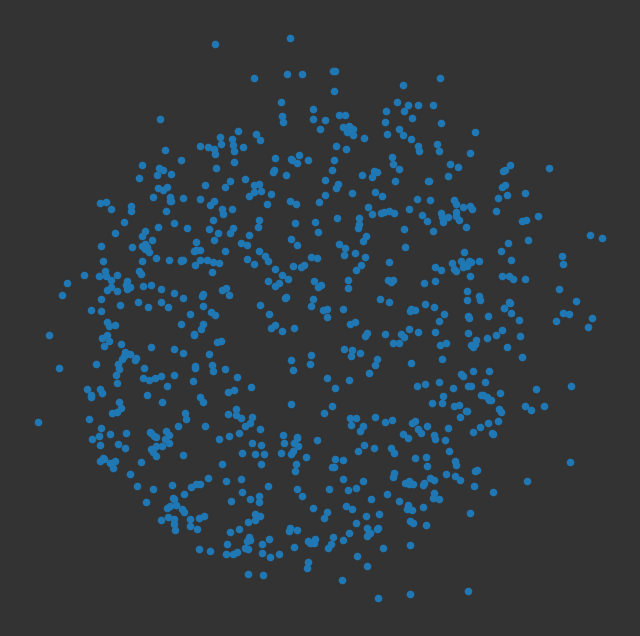

753

In [459]:
import math
# load the graph
G : nx.Graph = nx.from_numpy_array(similarity_matrix,parallel_edges=False)

# weights = np.array([d['weight'] for u, v, d in G.edges(data=True)])

# for (u, v, d), weight in zip(G.edges(data=True), weights):
#     d['weight'] = weight


# Verify the change
print(G.edges(data=True))
# visualize the graph
pos = nx.spring_layout(G, seed=0)
plt.figure(figsize=(8, 8) , facecolor='0.2')
plt.axis('off')
nx.draw_networkx_nodes(G,pos,node_size=20)
plt.show()
len(G.nodes)

In [460]:
#Community Louvain

import community as community_louvain
partition = community_louvain.best_partition(G,resolution=1,random_state=0) 


# # Igraph-fastgreedy

# import igraph as ig
# g = ig.Graph.from_networkx(G)
# dendrogram = g.community_fastgreedy()
# clusters = dendrogram.as_clustering(n=4)
# membership = clusters.membership
# partition= {node: membership[i] for i, node in enumerate(G.nodes())}


# # Girvan Newman

# from networkx.algorithms.community import girvan_newman
# communities = girvan_newman(G)
# partition = next(communities)
# partition = {node: i for i, community in enumerate(partition) for node in community}
# print(partition)

0    418
1    335
Name: count, dtype: int64
Number of communities :  2


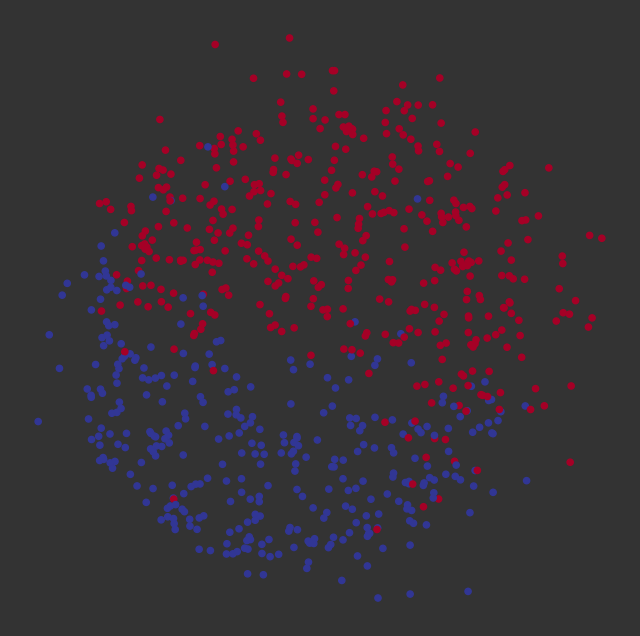

In [461]:
node_groups = []


print(pd.Series(partition).value_counts())
print("Number of communities : ",len(pd.Series(partition).unique()))

# Draw the graph
pos = nx.spring_layout(G, seed=0)
plt.figure(figsize=(8, 8) , facecolor='0.2')
plt.axis('off')

# Draw nodes in G
nx.draw_networkx_nodes(G, pos, node_size=20, cmap=plt.cm.RdYlBu, node_color=list(partition.values()))
# nx.draw_networkx_edges(G, pos, alpha=0.3)

plt.show()

In [462]:
# eigenvector Centrality
centrality = nx.eigenvector_centrality_numpy(G, weight='weight')

# # Calculate betweenness centrality
# centrality = nx.betweenness_centrality(G, weight='weight')

# Create a dictionary where keys are the clusters and values are lists of nodes in the cluster
clusters = {}
for node, cluster in partition.items():
    if cluster not in clusters:
        clusters[cluster] = []
    clusters[cluster].append(node)

# For each cluster, find the node with the highest eigenvector centrality
# for cluster, nodes in clusters.items():
#     centralities = {node: centrality[node] for node in nodes}
#     max_node = max(centralities, key=centralities.get)
#     print(f'Cluster {cluster}: most central node is {max_node} with centrality {centralities[max_node]}')

# For each cluster, find the top N nodes with the highest eigenvector centrality

for cluster, nodes in clusters.items():
    centralities = {node: centrality[node] for node in nodes}
    sorted_nodes = sorted(centralities, key=centralities.get, reverse=True)
    top_nodes = sorted_nodes[:N]
    print(f'Cluster {cluster}: top {N} central nodes are {top_nodes} with centralities {[centralities[node] for node in top_nodes]}')

Cluster 0: top 375 central nodes are [178, 182, 173, 175, 172, 188, 183, 185, 184, 171, 20, 177, 187, 174, 233, 263, 170, 142, 181, 180, 179, 189, 176, 262, 186, 272, 268, 238, 278, 261, 271, 232, 273, 231, 145, 141, 266, 265, 279, 277, 210, 236, 221, 147, 267, 211, 235, 237, 269, 239, 276, 280, 270, 330, 275, 390, 240, 140, 464, 149, 391, 144, 143, 220, 264, 274, 500, 499, 356, 234, 680, 608, 679, 678, 463, 387, 607, 677, 498, 606, 146, 331, 676, 605, 13, 462, 14, 16, 241, 355, 495, 329, 604, 148, 675, 425, 603, 459, 18, 15, 486, 424, 392, 423, 352, 461, 351, 17, 674, 489, 354, 485, 497, 494, 458, 484, 665, 422, 448, 460, 353, 483, 496, 453, 602, 664, 350, 457, 6, 490, 428, 255, 258, 493, 257, 669, 256, 242, 593, 663, 254, 454, 3, 455, 282, 281, 673, 284, 491, 283, 449, 285, 287, 286, 290, 289, 492, 288, 447, 167, 597, 531, 740, 456, 670, 388, 389, 12, 10, 253, 252, 199, 195, 197, 194, 198, 196, 259, 730, 193, 349, 166, 192, 191, 8, 601, 190, 671, 672, 11, 164, 260, 598, 165, 168, 163

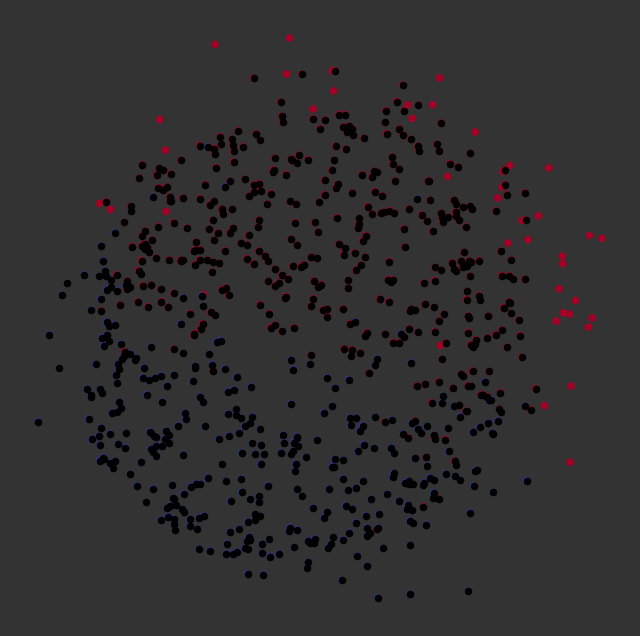

In [463]:
# Draw the graph
pos = nx.spring_layout(G,seed=0)
plt.figure(figsize=(8, 8), facecolor='0.2')
plt.axis('off')

# Draw all nodes
nx.draw_networkx_nodes(G, pos, node_size=20, cmap=plt.cm.RdYlBu, node_color=list(partition.values()))
# nx.draw_networkx_edges(G, pos, alpha=0.3)

# For each cluster, find the top N nodes with the highest eigenvector centrality and highlight them

for cluster, nodes in clusters.items():
    centralities = {node: centrality[node] for node in nodes}
    sorted_nodes = sorted(centralities, key=centralities.get, reverse=True)
    top_nodes = sorted_nodes[:N]
    nx.draw_networkx_nodes(G, pos, nodelist=top_nodes, node_size=20, node_color='black')  # Highlight central nodes

plt.show()

In [464]:
best_nodes = []

for cluster, nodes in clusters.items():
    centralities = {node: centrality[node] for node in nodes}
    sorted_nodes = sorted(centralities, key=centralities.get, reverse=True)
    top_nodes = sorted_nodes[:N]
    best_nodes.extend(top_nodes)
print(best_nodes)

[178, 182, 173, 175, 172, 188, 183, 185, 184, 171, 20, 177, 187, 174, 233, 263, 170, 142, 181, 180, 179, 189, 176, 262, 186, 272, 268, 238, 278, 261, 271, 232, 273, 231, 145, 141, 266, 265, 279, 277, 210, 236, 221, 147, 267, 211, 235, 237, 269, 239, 276, 280, 270, 330, 275, 390, 240, 140, 464, 149, 391, 144, 143, 220, 264, 274, 500, 499, 356, 234, 680, 608, 679, 678, 463, 387, 607, 677, 498, 606, 146, 331, 676, 605, 13, 462, 14, 16, 241, 355, 495, 329, 604, 148, 675, 425, 603, 459, 18, 15, 486, 424, 392, 423, 352, 461, 351, 17, 674, 489, 354, 485, 497, 494, 458, 484, 665, 422, 448, 460, 353, 483, 496, 453, 602, 664, 350, 457, 6, 490, 428, 255, 258, 493, 257, 669, 256, 242, 593, 663, 254, 454, 3, 455, 282, 281, 673, 284, 491, 283, 449, 285, 287, 286, 290, 289, 492, 288, 447, 167, 597, 531, 740, 456, 670, 388, 389, 12, 10, 253, 252, 199, 195, 197, 194, 198, 196, 259, 730, 193, 349, 166, 192, 191, 8, 601, 190, 671, 672, 11, 164, 260, 598, 165, 168, 163, 705, 324, 739, 35, 386, 417, 599, 6

In [465]:
selected_columns = X.columns[best_nodes]
print(selected_columns)
X = X[selected_columns]
X

Index(['det_TKEO_mean_9_coef', 'det_TKEO_std_3_coef', 'det_TKEO_mean_4_coef',
       'det_TKEO_mean_6_coef', 'det_TKEO_mean_3_coef', 'det_TKEO_std_9_coef',
       'det_TKEO_std_4_coef', 'det_TKEO_std_6_coef', 'det_TKEO_std_5_coef',
       'det_TKEO_mean_2_coef',
       ...
       'mean_1st_delta', 'GNE_SNR_TKEO', 'b3', 'mean_9th_delta', 'b4',
       'VFER_SNR_SEO', 'mean_delta_delta_0th', 'GNE_NSR_TKEO',
       'mean_8th_delta', 'mean_12th_delta'],
      dtype='object', length=710)


,det_TKEO_mean_9_coef,det_TKEO_std_3_coef,det_TKEO_mean_4_coef,det_TKEO_mean_6_coef,det_TKEO_mean_3_coef,det_TKEO_std_9_coef,det_TKEO_std_4_coef,det_TKEO_std_6_coef,det_TKEO_std_5_coef,det_TKEO_mean_2_coef,...,mean_1st_delta,GNE_SNR_TKEO,b3,mean_9th_delta,b4,VFER_SNR_SEO,mean_delta_delta_0th,GNE_NSR_TKEO,mean_8th_delta,mean_12th_delta
0,33.554697,6.957667,16.168067,10.967333,2.944333,55.739767,22.647167,33.750967,26.258400,0.377950,...,-0.003561,0.164847,420.310044,-0.001634,455.757978,169.525000,0.000182,1.678967,0.000773,-0.002016
1,23.691643,0.252880,1.738212,3.321500,0.207059,43.985523,2.595504,7.339425,6.821008,0.017896,...,0.001667,0.160117,1358.866892,-0.000506,338.478125,387.141846,-0.000477,1.661488,-0.002207,-0.001020
2,8.228842,2.466481,7.848377,7.349722,1.275583,17.452216,12.235619,15.749051,35.235247,0.145591,...,0.001827,0.119292,277.761735,0.000845,1853.796820,127.279674,-0.000793,1.588036,-0.000448,-0.000446
3,121.564000,110.449882,21.298132,24.275795,23.020815,185.887369,49.691390,44.332027,24.196858,19.943853,...,-0.002793,0.150899,726.901502,-0.003227,801.289958,237.901252,-0.000026,1.646622,0.000620,0.000657
4,65.046733,8.763533,35.713433,47.100433,4.471967,144.863933,71.674867,110.488467,121.144300,0.774763,...,0.002068,0.185557,160.527260,0.000412,273.352971,89.618667,-0.000006,1.697733,-0.001739,0.001058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,-77.919535,-0.859097,-3.901885,-38.872025,-0.522784,-167.539218,-8.305578,-133.356318,-25.313393,0.028001,...,-0.002940,0.108063,2082.744486,-0.003009,248.261706,563.033164,-0.000083,1.564537,0.002525,-0.000924
372,1331.249533,15.150700,89.566733,151.963033,8.354167,2150.618700,134.652867,257.406633,174.770933,1.519757,...,-0.002711,0.167103,253.799761,-0.000044,377.363935,137.359633,0.001068,1.664433,0.000289,0.000171
373,3355.193967,1184.055553,1365.844233,2374.203700,676.249573,6546.010700,2991.521400,6234.796100,2960.455867,169.960500,...,-0.001353,0.146453,423.280992,0.001458,293.487699,131.058067,-0.000297,1.664333,-0.000977,0.000344
374,27.686833,6.345667,20.511733,43.252867,3.245300,58.506033,23.461967,113.837100,53.719133,0.134501,...,-0.002512,0.153783,288.206518,-0.001478,726.664965,705.671967,0.000360,1.636300,-0.003286,-0.001133


In [466]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

X_temp, X_test, Y_temp, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

X_train, X_val, Y_train, Y_val = train_test_split(X_temp, Y_temp, test_size=0.25, random_state=42)

scaler=MinMaxScaler()
columns=X_train.columns

X_train=pd.DataFrame(scaler.fit_transform(X_train), columns=columns)
X_val=pd.DataFrame(scaler.fit_transform(X_val), columns=columns)
X_test=pd.DataFrame(scaler.fit_transform(X_test), columns=columns)
print(X_train.columns)

Index(['det_TKEO_mean_9_coef', 'det_TKEO_std_3_coef', 'det_TKEO_mean_4_coef',
       'det_TKEO_mean_6_coef', 'det_TKEO_mean_3_coef', 'det_TKEO_std_9_coef',
       'det_TKEO_std_4_coef', 'det_TKEO_std_6_coef', 'det_TKEO_std_5_coef',
       'det_TKEO_mean_2_coef',
       ...
       'mean_1st_delta', 'GNE_SNR_TKEO', 'b3', 'mean_9th_delta', 'b4',
       'VFER_SNR_SEO', 'mean_delta_delta_0th', 'GNE_NSR_TKEO',
       'mean_8th_delta', 'mean_12th_delta'],
      dtype='object', length=710)


In [467]:
import random


X_train_sets=[]
Y_train_sets=[]

X_val_sets=[]
Y_val_sets=[]

X_test_sets=[]
Y_test_sets=[]

random.seed(5)
test_set_IDs = []
for i in range(bags):
    resampled_rows = random.choices(range(X_train.shape[0]), k=k)
    X_train_sets.append(X_train.iloc[resampled_rows])
    Y_train_sets.append(Y_train.iloc[resampled_rows])

    resampled_rows = random.choices(range(X_val.shape[0]), k=k)
    X_val_sets.append(X_val.iloc[resampled_rows])
    Y_val_sets.append(Y_val.iloc[resampled_rows])
    
    resampled_rows = random.choices(range(X_test.shape[0]), k=k)
    test_set_IDs.append(resampled_rows)
    X_test_sets.append(X_test.iloc[resampled_rows])
    Y_test_sets.append(Y_test.iloc[resampled_rows])
print(test_set_IDs)

[[7, 94, 78, 48, 32, 88, 102, 16, 54, 62, 56, 37, 17, 66, 91, 7, 25, 92, 89, 74, 2, 81, 110, 112, 79, 5, 95, 24, 72, 107, 80, 15, 33, 103, 16, 68, 46, 18, 70, 4, 12, 42, 8, 6, 65, 83, 99, 15, 48, 35, 67, 55, 106, 42, 6, 78, 17, 71, 57, 102, 62, 70, 29, 62, 28, 84, 58, 15, 26, 41, 83, 20, 80, 74, 9, 75, 10, 14, 67, 26, 99, 54, 36, 90, 3, 81, 6, 17, 107, 76, 25, 13, 109, 75, 92, 15, 70, 40, 26, 37, 69, 39, 43, 15, 93, 73, 90, 48, 96, 58, 66, 64, 83, 44, 10, 3, 22, 4, 100, 54, 85, 0, 53, 100, 69, 48, 52, 11, 17, 17, 42, 43, 99, 17, 28, 31, 18, 32, 26, 54, 3, 104, 41, 105, 77, 76, 53, 106, 13, 75, 32, 76, 82, 18, 22, 2, 26, 8, 45, 110, 41], [108, 106, 8, 85, 81, 33, 13, 54, 40, 83, 103, 43, 32, 56, 78, 89, 65, 33, 38, 95, 58, 5, 47, 26, 75, 8, 30, 10, 53, 111, 61, 43, 105, 10, 40, 91, 0, 86, 40, 1, 28, 51, 43, 58, 6, 24, 110, 50, 53, 9, 31, 107, 77, 57, 5, 44, 87, 49, 67, 101, 72, 71, 4, 2, 86, 46, 98, 93, 103, 42, 112, 85, 100, 16, 88, 47, 109, 112, 24, 47, 30, 53, 32, 75, 13, 19, 51, 8, 

In [468]:
from sklearn.model_selection import KFold

from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression,RidgeClassifier

from sklearn.metrics import accuracy_score

models=[]
for i in range(len(X_train_sets)):
    models.append([SVC(), GaussianNB(), KNeighborsClassifier(),\
                    DecisionTreeClassifier(random_state=42), LogisticRegression(random_state=42), RidgeClassifier(random_state=42)])

k_fold=KFold(n_splits=n_splits, shuffle=True, random_state=42)

for i in range(len(X_train_sets)):
    X_train_fromsets=X_train_sets[i]
    Y_train_fromsets=Y_train_sets[i]
    
    for train_index, val_index in k_fold.split(X_train_fromsets):
        X_train_kfold, X_val_kfold = X_train_fromsets.iloc[train_index].values, X_train_fromsets.iloc[val_index].values
        Y_train_kfold, Y_val_kfold = Y_train_fromsets.iloc[train_index].values, Y_train_fromsets.iloc[val_index].values

        for model in models[i]:
            model.fit(X_train_kfold, Y_train_kfold)

c:\Users\archi\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\archi\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/st

In [469]:
best_models=[]
for i in range(len(X_val_sets)):
    X_val_fromsets=X_val_sets[i]
    Y_val_fromsets=Y_val_sets[i]

    accuracies=[]
    print(f"Bag {i+1}:")
    for model in models[i]:
        Y_pred = model.predict(X_val_fromsets.values)
        acc=accuracy_score(Y_val_fromsets, Y_pred)
        accuracies.append(acc)
        print(f"{type(model).__name__} : ",acc)
    best_model=models[i][accuracies.index(max(accuracies))]
    best_models.append(best_model)
    print(f"Best model: {type(best_model).__name__}")
        
    print("\n")

Bag 1:
SVC :  0.7639751552795031
GaussianNB :  0.5714285714285714
KNeighborsClassifier :  0.6832298136645962
DecisionTreeClassifier :  0.5403726708074534
LogisticRegression :  0.8136645962732919
RidgeClassifier :  0.7701863354037267
Best model: LogisticRegression


Bag 2:
SVC :  0.7018633540372671
GaussianNB :  0.391304347826087
KNeighborsClassifier :  0.7267080745341615
DecisionTreeClassifier :  0.639751552795031
LogisticRegression :  0.7204968944099379
RidgeClassifier :  0.6086956521739131
Best model: KNeighborsClassifier


Bag 3:
SVC :  0.7391304347826086
GaussianNB :  0.4472049689440994
KNeighborsClassifier :  0.7888198757763976
DecisionTreeClassifier :  0.8322981366459627
LogisticRegression :  0.782608695652174
RidgeClassifier :  0.7515527950310559
Best model: DecisionTreeClassifier


Bag 4:
SVC :  0.8136645962732919
GaussianNB :  0.453416149068323
KNeighborsClassifier :  0.8198757763975155
DecisionTreeClassifier :  0.7391304347826086
LogisticRegression :  0.8260869565217391
Ridge

In [470]:
# # For feature resampling
# Y_pred_sets=pd.DataFrame()
# for i in range(len(X_test_sets)):
#     X_test_fromsets=X_test_sets[i]
#     Y_test_fromsets=Y_test_sets[i]

#     best_model=best_models[i]
#     Y_pred = best_model.predict(X_test_fromsets.values)
#     Y_pred_sets[f"Y_pred_{i}"]=Y_pred
#     acc=accuracy_score(Y_test_fromsets, Y_pred)
#     print(f"{type(best_model).__name__} : ",acc)
#     print("\n")
# print(Y_pred_sets)
# print(len(test_set_IDs), len(test_set_IDs[0]))

Y_pred_sets=pd.DataFrame()
for i in range(bags):
    Y_pred_sets[f"Y_pred_{i}"]= best_models[i].predict(X_test.values)
print(Y_pred_sets)

     Y_pred_0  Y_pred_1  Y_pred_2  Y_pred_3  Y_pred_4  Y_pred_5  Y_pred_6
0         1.0       1.0       1.0       1.0       1.0       1.0       1.0
1         1.0       1.0       0.0       1.0       1.0       1.0       1.0
2         0.0       1.0       0.0       0.0       0.0       1.0       0.0
3         0.0       0.0       0.0       0.0       0.0       0.0       0.0
4         1.0       0.0       0.0       1.0       1.0       0.0       1.0
..        ...       ...       ...       ...       ...       ...       ...
108       1.0       1.0       0.0       1.0       1.0       1.0       1.0
109       0.0       0.0       0.0       0.0       0.0       0.0       0.0
110       1.0       0.0       0.0       1.0       1.0       1.0       1.0
111       0.0       0.0       0.0       0.0       0.0       0.0       0.0
112       1.0       1.0       1.0       1.0       1.0       1.0       1.0

[113 rows x 7 columns]


In [471]:
from sklearn.metrics import confusion_matrix

Y_pred_sets['mode']=Y_pred_sets.mode(axis=1)
tn, fp, fn, tp = confusion_matrix(Y_test, Y_pred_sets['mode']).ravel()

sensitivity = tp / (tp + fn)
specificity = tn / (tn + fp)
fpr = fp / (fp + tn)
ppv = tp / (tp + fp)
npv = tn / (tn + fn)
accuracy = (tp + tn) / (tp + fp + tn + fn)

print(f"Sensitivity: {sensitivity}")
print(f"Specificity: {specificity}")
print(f"False Positive Rate: {fpr}")
print(f"Positive Predictive Value: {ppv}")
print(f"Negative Predictive Value: {npv}")
print(f"\nMajority Voting Accuracy : ",accuracy)
Y_pred_sets.drop('mode', axis=1, inplace=True)

Sensitivity: 0.8852459016393442
Specificity: 0.9423076923076923
False Positive Rate: 0.057692307692307696
Positive Predictive Value: 0.9473684210526315
Negative Predictive Value: 0.875

Majority Voting Accuracy :  0.911504424778761
